In [1]:
from main import *
from useful_functions import *
from visualization import *

from brainspace.gradient.embedding import DiffusionMaps, diffusion_mapping

%matplotlib inline
plt.rcParams['font.size'] = 6

# Setting paths

In [2]:
top_directory = '/media/anleg84/Backup Plus/CERVO/Data/Networks2024/'
atlas_path = '/home/anleg84/Documents/Atlas/MapzebrainOld/'

In [3]:
atlas = MapzebrainAtlas(atlas_path)
centroids = np.concatenate([atlas.regionCentroids['left'], atlas.regionCentroids['right']], axis=0)
centroids[:, 1] = 974 - centroids[:, 1]
excluded = np.load('Results/excluded_regions.npy')

centroids_ = np.delete(centroids, np.concatenate([excluded, excluded + 70]), axis=0)

In [4]:
datasets = get_datasets(top_directory, keywords=['920nm'])

# Loading figure-related data

In [5]:
FC = np.load('Results/FC_matrix.npy')
SC = np.load('Data/undirected_terminals_expanded.npy')
FC_stim = np.load('Results/figure6_FC_stim.npy')
FC_hi = np.load('Results/figure6_FC_hires_spontaneous.npy')
FC_hi_stim = np.load('Results/figure6_FC_hires_stim.npy')

modes_FC = np.load('Results/figure6_gradients_functional.npy')
modes_SC = np.load('Results/figure6_gradients_structural.npy')

eigvals_FC = np.load('Results/figure6_eigenvalues_functional.npy')
eigvals_SC = np.load('Results/figure6_eigenvalues_structural.npy')

correlations = np.load('Results/figure6_correlations_modes.npy')
mapping = np.load('Results/figure6_mapping_modes.npy')

centroids_dark = np.load('Results/figure5_centroids_dark.npy')
centroids_motor = np.load('Results/figure5_centroids_motor.npy')

p_motor = np.load('Results/figure5_pvalues_motor.npy')
p_dark = np.load('Results/figure5_pvalues_dark.npy')

significance = 0.025

sensorimotor_index = np.load('Results/figure6_sensorimotor_index.npy')
sensorimotor_index_hi = np.load('Results/figure6_sensorimotor_index_hires.npy')

centroids_hires = np.load('Results/figure6_centroids_hires.npy')

gradient1_spont = modes_FC[0]

map = DiffusionMaps(n_components=65, alpha=0.5, random_state=420)
embedding = map.fit_transform(np.abs(FC_stim))
gradient1_stim = embedding[:, 0].flatten()

map = DiffusionMaps(n_components=FC_hi_stim.shape[0], alpha=0.5, random_state=420)
embedding = map.fit_transform(np.abs(FC_hi))
gradient1_spont_hi = embedding[:, 0].flatten()

map = DiffusionMaps(n_components=FC_hi_stim.shape[0], alpha=0.5, random_state=420)
embedding = map.fit_transform(np.abs(FC_hi_stim))
gradient1_stim_hi = embedding[:, 0].flatten()

/home/anleg84/anaconda3/envs/calimba/lib/python3.9/site-packages/scipy/sparse/linalg/_eigen/arpack/arpack.py:1592: RuntimeWarning: k >= N for N * N square matrix. Attempting to use scipy.linalg.eigh instead.
  warnings.warn("k >= N for N * N square matrix. "


# Figure 6 layout

In [6]:
cmap_div = 'coolwarm'

color1 = [0, 0, 0]
blue = hex2rgb('#006DAA')
color3 = [1, 1, 1]
cmap_blue = make_cmap([color1, blue, color3], [0, 0.5, 1])

In [7]:
blue = plt.get_cmap('coolwarm')(0 + 12)
red = plt.get_cmap('coolwarm')(255 - 12)

In [8]:
#cmap = make_cmap([[1, 1, 1], [255/255, 187/255, 0]], [0, 1])
color = [72/255, 184/255, 208/255]
cmap = make_cmap([[1, 1, 1], color], [0, 1])
cmap_FC = cmap

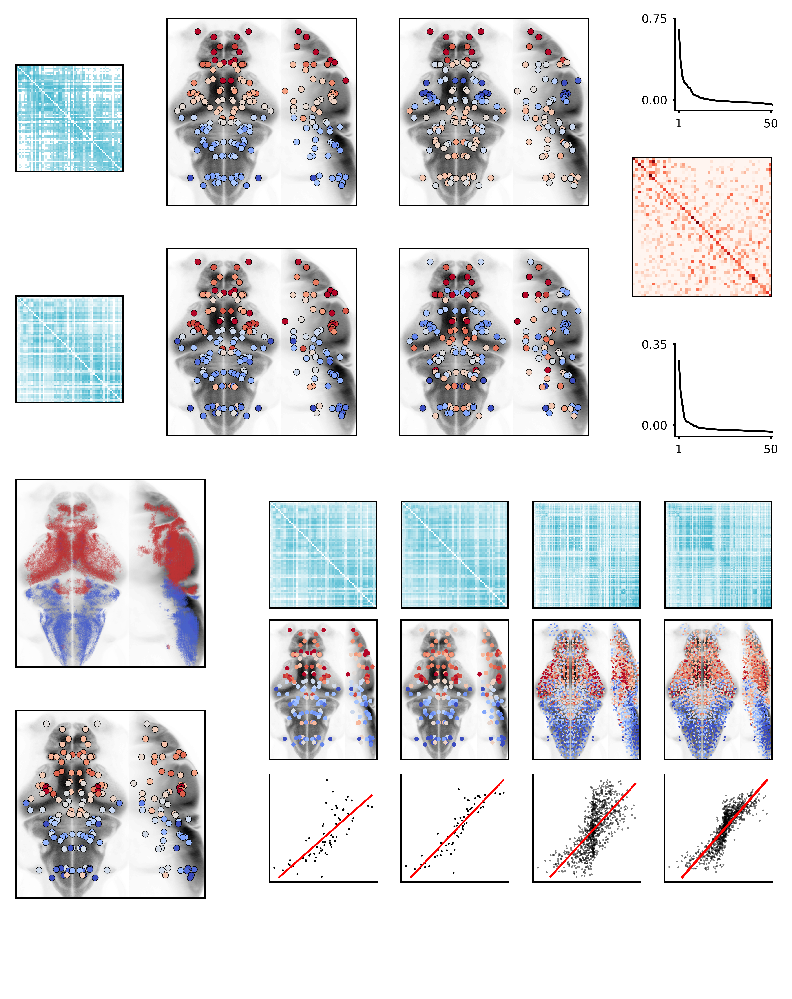

In [9]:
fig = PaperFigure(figsize=(7, 9), dpi=900)

fig.set_tick_length(1)
fig.set_font_size(6)
fig.add_background()

# Layout ----------------------------------------------------------------------------

y = 0
w = 1.75
pad = 0.4
w2 = (2 * w + pad) / 3
fig.add_axes('SC_matrix', (0, 1.75 / 4), 1, 1)

fig.add_axes('grad1_SC_top', (1.4, y), w * 0.6, w)
fig.add_axes('grad1_SC_side', (1.4 + 0.6 * w, y), w * 0.4, w)

fig.add_axes('grad2_SC_top', (1.4 + w + pad, y), w * 0.6, w)
fig.add_axes('grad2_SC_side', (1.4 + w + pad + 0.6 * w, y), w * 0.4, w)

fig.add_axes('eigvals_SC', (1.4 + 2 * (w + pad) + 0.4, y), w2, 2 * w2 / 3)
fig.add_axes('correlations', (1.4 + 2 * (w + pad), y + w2), w2, w2)
fig.add_axes('eigvals_FC', (1.4 + 2 * (w + pad) + 0.4, y + 2 * w2 + (w2 / 3)), w2, 2 * w2 / 3 )


y = w + pad
w = 1.75
pad = 0.4
fig.add_axes('FC_matrix', (0, y + (1.75 / 4)), 1, 1)

fig.add_axes('grad1_FC_top', (1.4, y), w * 0.6, w)
fig.add_axes('grad1_FC_side', (1.4 + 0.6 * w, y), w * 0.4, w)

fig.add_axes('grad2_FC_top', (1.4 + w + pad, y), w * 0.6, w)
fig.add_axes('grad2_FC_side', (1.4 + w + pad + 0.6 * w, y), w * 0.4, w)

fig.add_axes('centroids_sensorimotor', (0, y + w + pad), 0.6 * w, w)
fig.add_axes('centroids_sensorimotor_side', (0.6 * w, y + w + pad), 0.4 * w, w)

fig.add_axes('index_top', (0, y + 2 * (w + pad)), 0.6 * w, w)
fig.add_axes('index_side', (0.6 * w, y + 2* (w + pad)), 0.4 * w, w)

alpha = 0.2
Y = y + w + pad + alpha
X = 7 - (w + pad + alpha)
p = (X - 4) / 3
ratio = 0.7

fig.add_axes('FC1', (w + pad + alpha, Y), 1, 1)
fig.add_axes('grad1_top', (w + pad + alpha, Y + 1 + p / 2), ratio, 1.3)
fig.add_axes('grad1_side', (w + pad + alpha + ratio, Y + 1 + p / 2), (1 - ratio), 1.3)
fig.add_axes('scatter1', (w + pad + 0.2, 9 - w - alpha), 1, 1)

fig.add_axes('FC2', (w + pad + alpha + 1 * (1 + p), Y), 1, 1)
fig.add_axes('grad2_top', (w + pad + alpha + 1 * (1 + p), Y + 1 + p / 2), ratio, 1.3)
fig.add_axes('grad2_side', (w + pad + alpha + 1 * (1 + p) + ratio, Y + 1 + p / 2), 1 - ratio, 1.3)
fig.add_axes('scatter2', (w + pad + 0.2 + 1 * (1 + p), 9 - w - alpha), 1, 1)

fig.add_axes('FC3', (w + pad + alpha + 2 * (1 + p), Y), 1, 1)
fig.add_axes('grad3_top', (w + pad + alpha + 2 * (1 + p), Y + 1 + p / 2), ratio, 1.3)
fig.add_axes('grad3_side', (w + pad + alpha + 2 * (1 + p) + ratio, Y + 1 + p / 2), 1 - ratio, 1.3)
fig.add_axes('scatter3', (w + pad + 0.2 + 2 * (1 + p), 9 - w - alpha), 1, 1)

fig.add_axes('FC4', (w + pad + alpha + 3 * (1 + p), Y), 1, 1)
fig.add_axes('grad4_top', (w + pad + alpha + 3 * (1 + p), Y + 1 + p / 2), ratio, 1.3)
fig.add_axes('grad4_side', (w + pad + alpha + 3 * (1 + p) + ratio, Y + 1 + p / 2), 1 - ratio, 1.3)
fig.add_axes('scatter4', (w + pad + 0.2 + 3 * (1 + p), 9 - w - alpha), 1, 1)

# Content ---------------------------------------------------------------------

ax = fig.axes['SC_matrix']
ax.imshow(SC, cmap=cmap_FC, vmin=0.1, vmax=0.9)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['grad1_SC_top']
v = np.percentile(np.abs(modes_SC[0]), 90)
ax.imshow(atlas.XYprojection, aspect='auto', cmap='binary')
c = centroids_
ax.scatter(c[:, 0], c[:, 1], c=double(modes_SC[0]), cmap=cmap_div, alpha=1, edgecolor='black', linewidth=0.25, s=10, rasterized=True, vmin=-v, vmax=v)
ax.set_xlim([65, 505])
ax.set_ylim([850, 50])
ax.spines[['right']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['grad1_SC_side']
ax.imshow(np.rot90(atlas.XZprojection, k=3), aspect='auto', cmap='binary')
ax.scatter(359 - c[:, 2], c[:, 1], c=double(modes_SC[0]), cmap=cmap_div, alpha=1, edgecolor='black', linewidth=0.25, s=10, rasterized=True, vmin=-v, vmax=v)
ax.set_xlim([50, 359])
ax.set_ylim([850, 50])
ax.spines[['left']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['grad2_SC_top']
v = np.percentile(np.abs(modes_SC[1]), 90)
ax.imshow(atlas.XYprojection, aspect='auto', cmap='binary')
c = centroids_
ax.scatter(c[:, 0], c[:, 1], c=double(modes_SC[1]), cmap=cmap_div, alpha=1, edgecolor='black', linewidth=0.25, s=10, rasterized=True, vmin=-v, vmax=v)
ax.set_xlim([65, 505])
ax.set_ylim([850, 50])
ax.spines[['right']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['grad2_SC_side']
ax.imshow(np.rot90(atlas.XZprojection, k=3), aspect='auto', cmap='binary')
ax.scatter(359 - c[:, 2], c[:, 1], c=double(modes_SC[1]), cmap=cmap_div, alpha=1, edgecolor='black', linewidth=0.25, s=10, rasterized=True, vmin=-v, vmax=v)
ax.set_xlim([50, 359])
ax.set_ylim([850, 50])
ax.spines[['left']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['FC_matrix']
ax.imshow(FC, cmap=cmap_FC, vmin=0.1, vmax=0.9)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['grad1_FC_top']
v = np.percentile(np.abs(modes_FC[0]), 90)
ax.imshow(atlas.XYprojection, aspect='auto', cmap='binary')
c = centroids_
ax.scatter(c[:, 0], c[:, 1], c=double(modes_FC[0]), cmap=cmap_div, alpha=1, edgecolor='black', linewidth=0.25, s=10, rasterized=True, vmin=-v, vmax=v)
ax.set_xlim([65, 505])
ax.set_ylim([850, 50])
ax.spines[['right']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['grad1_FC_side']
ax.imshow(np.rot90(atlas.XZprojection, k=3), aspect='auto', cmap='binary')
ax.scatter(359 - c[:, 2], c[:, 1], c=double(modes_FC[0]), cmap=cmap_div, alpha=1, edgecolor='black', linewidth=0.25, s=10, rasterized=True, vmin=-v, vmax=v)
ax.set_xlim([50, 359])
ax.set_ylim([850, 50])
ax.spines[['left']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['grad2_FC_top']
v = np.percentile(np.abs(modes_FC[mapping[1]]), 90)
ax.imshow(atlas.XYprojection, aspect='auto', cmap='binary')
c = centroids_
ax.scatter(c[:, 0], c[:, 1], c=double(modes_FC[mapping[1]]), cmap=cmap_div, alpha=1, edgecolor='black', linewidth=0.25, s=10, rasterized=True, vmin=-v, vmax=v)
ax.set_xlim([65, 505])
ax.set_ylim([850, 50])
ax.spines[['right']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['grad2_FC_side']
ax.imshow(np.rot90(atlas.XZprojection, k=3), aspect='auto', cmap='binary')
ax.scatter(359 - c[:, 2], c[:, 1], c=double(modes_FC[mapping[1]]), cmap=cmap_div, alpha=1, edgecolor='black', linewidth=0.25, s=10, rasterized=True, vmin=-v, vmax=v)
ax.set_xlim([50, 359])
ax.set_ylim([850, 50])
ax.spines[['left']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['eigvals_SC']
ax.plot(np.arange(len(eigvals_SC)) + 1, eigvals_SC, color='black', linewidth=1, markersize=1)
ax.set_xlim([-1, 51])
ax.set_ylim([-0.1, 0.75])
ax.set_xticks([1, 50])
ax.set_yticks([0, 0.75])
ax.spines[['top', 'right']].set_visible(False)

ax = fig.axes['eigvals_FC']
ax.plot(np.arange(len(eigvals_FC)) + 1, eigvals_FC, color='black', linewidth=1, markersize=1)
ax.set_xlim([-1, 51])
ax.set_ylim([-0.05, 0.35])
ax.set_xticks([1, 50])
ax.set_yticks([0, 0.35])
ax.spines[['top', 'right']].set_visible(False)

ax = fig.axes['correlations']
ax.imshow(np.abs(correlations), cmap='Reds', vmin=0.1, vmax=0.5)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['centroids_sensorimotor']
ax.imshow(atlas.XYprojection, aspect='auto', cmap='binary', vmin=0, vmax=2 * 89)
c1 = centroids_dark[p_dark < significance]
c2 = centroids_motor[p_motor < significance]
c = np.concatenate([c1, c2], axis=0)
colors = [red] * c1.shape[0] + [blue] * c2.shape[0]
order = np.arange(c.shape[0])
np.random.shuffle(order)
ax.scatter(c[order, 0], c[order, 1], color=np.array(colors)[order], alpha=0.1, edgecolor='None', s=0.25, rasterized=True)
#c = centroids_motor[p_motor < significance]
#ax.scatter(c[:, 0], c[:, 1], color=blue, alpha=0.05, edgecolor='None', s=1, rasterized=True)
ax.set_xlim([65, 505])
ax.set_ylim([850, 50])
ax.set_xticks([])
ax.set_yticks([])
ax.spines[['right']].set_visible(False)

ax = fig.axes['centroids_sensorimotor_side']
ax.imshow(np.rot90(atlas.XZprojection, k=3), aspect='auto', cmap='binary')
ax.scatter(359 - c[order, 2], c[order, 1], color=np.array(colors)[order], alpha=0.1, edgecolor='None', s=0.25, rasterized=True)
ax.set_xlim([50, 359])
ax.set_ylim([850, 50])
ax.spines[['left']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['index_top']
v = 0.2
ax.imshow(atlas.XYprojection, aspect='auto', cmap='binary')
c = centroids_
ax.scatter(c[:, 0], c[:, 1], c=double(sensorimotor_index), cmap=cmap_div, alpha=1, edgecolor='black', linewidth=0.25, s=10, rasterized=True, vmin=-v, vmax=v)
ax.set_xlim([65, 505])
ax.set_ylim([850, 50])
ax.spines[['right']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['index_side']
ax.imshow(np.rot90(atlas.XZprojection, k=3), aspect='auto', cmap='binary')
ax.scatter(359 - c[:, 2], c[:, 1], c=double(sensorimotor_index), cmap=cmap_div, alpha=1, edgecolor='black', linewidth=0.25, s=10, rasterized=True, vmin=-v, vmax=v)
ax.set_xlim([50, 359])
ax.set_ylim([850, 50])
ax.spines[['left']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

vmin1, vmax1 = 0, 1
vmin2, vmax2 = 0, 0.5


ax = fig.axes['FC1']
ax.imshow(FC, cmap=cmap_FC, vmin=vmin1, vmax=vmax1)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['FC2']
ax.imshow(FC_stim, cmap=cmap_FC, vmin=vmin1, vmax=vmax1)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['FC3']
ax.imshow(FC_hi, cmap=cmap_FC, vmin=vmin2, vmax=vmax2)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['FC4']
ax.imshow(FC_hi_stim, cmap=cmap_FC, vmin=vmin2, vmax=vmax2)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['grad1_top']
gradient = gradient1_spont
c = centroids_
v = np.percentile(np.abs(gradient), 90)
ax.imshow(atlas.XYprojection, aspect='auto', cmap='binary')
ax.scatter(c[:, 0], c[:, 1], c=double(gradient), cmap=cmap_div, alpha=1, edgecolor='None', linewidth=0.25, s=5, rasterized=True, vmin=-v, vmax=v)
ax.set_xlim([65, 505])
ax.set_ylim([850, 50])
ax.spines[['right']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['grad1_side']
ax.imshow(np.rot90(atlas.XZprojection, k=3), aspect='auto', cmap='binary')
ax.scatter(359 - c[:, 2], c[:, 1], c=double(gradient), cmap=cmap_div, alpha=1, edgecolor='None', linewidth=0.25, s=5, rasterized=True, vmin=-v, vmax=v)
ax.set_xlim([40, 359])
ax.set_ylim([850, 50])
ax.spines[['left']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['grad2_top']
gradient = -gradient1_stim
c = centroids_
v = np.percentile(np.abs(gradient), 90)
ax.imshow(atlas.XYprojection, aspect='auto', cmap='binary')
ax.scatter(c[:, 0], c[:, 1], c=double(gradient), cmap=cmap_div, alpha=1, edgecolor='None', linewidth=0.25, s=5, rasterized=True, vmin=-v, vmax=v)
ax.set_xlim([65, 505])
ax.set_ylim([850, 50])
ax.spines[['right']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['grad2_side']
ax.imshow(np.rot90(atlas.XZprojection, k=3), aspect='auto', cmap='binary')
ax.scatter(359 - c[:, 2], c[:, 1], c=double(gradient), cmap=cmap_div, alpha=1, edgecolor='None', linewidth=0.25, s=5, rasterized=True, vmin=-v, vmax=v)
ax.set_xlim([40, 359])
ax.set_ylim([850, 50])
ax.spines[['left']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['grad3_top']
gradient = gradient1_spont_hi
c = centroids_hires
v = np.percentile(np.abs(gradient), 90)
ax.imshow(atlas.XYprojection, aspect='auto', cmap='binary')
ax.scatter(c[:, 0], c[:, 1], c=double(gradient), cmap=cmap_div, alpha=1, edgecolor='None', linewidth=0.25, s=1, rasterized=True, vmin=-v, vmax=v)
ax.set_xlim([65, 505])
ax.set_ylim([850, 50])
ax.spines[['right']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['grad3_side']
ax.imshow(np.rot90(atlas.XZprojection, k=3), aspect='auto', cmap='binary')
ax.scatter(359 - c[:, 2], c[:, 1], c=double(gradient), cmap=cmap_div, alpha=1, edgecolor='None', linewidth=0.25, s=1, rasterized=True, vmin=-v, vmax=v)
ax.set_xlim([40, 359])
ax.set_ylim([850, 50])
ax.spines[['left']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['grad4_top']
gradient = -gradient1_stim_hi
c = centroids_hires
v = np.percentile(np.abs(gradient), 90)
ax.imshow(atlas.XYprojection, aspect='auto', cmap='binary')
ax.scatter(c[:, 0], c[:, 1], c=double(gradient), cmap=cmap_div, alpha=1, edgecolor='None', linewidth=0.25, s=1, rasterized=True, vmin=-v, vmax=v)
ax.set_xlim([65, 505])
ax.set_ylim([850, 50])
ax.spines[['right']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['grad4_side']
ax.imshow(np.rot90(atlas.XZprojection, k=3), aspect='auto', cmap='binary')
ax.scatter(359 - c[:, 2], c[:, 1], c=double(gradient), cmap=cmap_div, alpha=1, edgecolor='None', linewidth=0.25, s=1, rasterized=True, vmin=-v, vmax=v)
ax.set_xlim([40, 359])
ax.set_ylim([850, 50])
ax.spines[['left']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['scatter1']
ax.scatter(sensorimotor_index, gradient1_spont, color='black', s=1, alpha=1, edgecolor='None')
a, b = np.polyfit(sensorimotor_index, gradient1_spont, 1)
ax.plot([-0.25, 0.25], [-a * 0.25 + b, a * 0.25 + b], color='red', linewidth=1)
ax.spines[['top', 'right']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['scatter2']
ax.scatter(sensorimotor_index, -gradient1_stim, color='black', s=1, alpha=1, edgecolor='None')
a, b = np.polyfit(sensorimotor_index, -gradient1_stim, 1)
ax.plot([-0.25, 0.25], [-a * 0.25 + b, a * 0.25 + b], color='red', linewidth=1)
ax.spines[['top', 'right']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['scatter3']
ax.scatter(sensorimotor_index_hi, gradient1_spont_hi, color='black', s=1, alpha=0.5, edgecolor='None')
a, b = np.polyfit(sensorimotor_index_hi, gradient1_spont_hi, 1)
ax.plot([-0.35, 0.35], [-a * 0.35 + b, a * 0.35 + b], color='red', linewidth=1)
ax.spines[['top', 'right']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['scatter4']
ax.scatter(sensorimotor_index_hi, -gradient1_stim_hi, color='black', s=1, alpha=0.5, edgecolor='None')
a, b = np.polyfit(sensorimotor_index_hi, -gradient1_stim_hi, 1)
ax.plot([-0.35, 0.35], [-a * 0.35 + b, a * 0.35 + b], color='red', linewidth=1.25)
ax.spines[['top', 'right']].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])

# Display ---------------------------------------------------------------------

fig.show()

In [28]:
fig.save('/home/anleg84/Documents/Figures/PaperNetworks2024/figure6_incomplete.svg')

# Manual values

In [11]:
from scipy.stats import spearmanr

#### Colorbars

In [12]:
v = np.percentile(np.abs(modes_SC[0]), 90)
print(v)

1.2623451065149214


In [13]:
v = np.percentile(np.abs(modes_SC[1]), 90)
print(v)

0.7307221435987282


In [14]:
v = np.percentile(np.abs(modes_FC[mapping[0]]), 90)
print(v)

0.4480330677675725


In [15]:
v = np.percentile(np.abs(modes_FC[mapping[1]]), 90)
print(v)

0.22020839641089998


#### Correlations between modes 1 and 2

In [16]:
np.abs(pearsonr(modes_FC[0], modes_SC[0])[0])

0.794966383274677

In [27]:
np.abs(pearsonr(modes_FC[mapping[1]], modes_SC[1])[0])

0.3230244926076591

In [33]:
mapping[1]

1

#### Correlation matrix of modes

In [21]:
np.max(np.abs(correlations))

0.794966383274677

#### Correlations in scatter plots

In [22]:
from scipy.stats import spearmanr

In [23]:
spearmanr(sensorimotor_index, gradient1_spont)[0]

0.8319493006993007

In [24]:
spearmanr(sensorimotor_index, -gradient1_stim)[0]

0.9213286713286714

In [25]:
spearmanr(sensorimotor_index_hi, gradient1_spont_hi)[0]

0.7192276815092815

In [26]:
spearmanr(sensorimotor_index_hi, -gradient1_stim_hi)[0]

0.886770344500746